<a href="https://colab.research.google.com/github/GitData-GA/Shot-Marilyns/blob/main/code/Marilynshots.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import numpy as np
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import math
import pandas as pd
from glob import glob
import skimage.io as skio
from skimage.color import rgb2gray, rgba2rgb, hsv2rgb
from tqdm import notebook as tqdm
from skimage.transform import resize
import os
import gdown
from tqdm.notebook import tqdm
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# EDA

In [6]:
image_links = [
    "https://shotmarilyns.gd.edu.kg/assets/img/shot-marilyn-13709288.jpg",
    "https://shotmarilyns.gd.edu.kg/assets/img/shot-marilyn-15650867.jpg",
    "https://shotmarilyns.gd.edu.kg/assets/img/shot-marilyn-15715280.jpg",
    "https://shotmarilyns.gd.edu.kg/assets/img/shot-marilyn-15715866.jpg",
    "https://shotmarilyns.gd.edu.kg/assets/img/shot-marilyn-15715916.jpg",
    "https://shotmarilyns.gd.edu.kg/assets/img/shot-marilyn-15717134.jpg",
    "https://shotmarilyns.gd.edu.kg/assets/img/shot-marilyn-15717647.jpg",
    "https://shotmarilyns.gd.edu.kg/assets/img/shot-marilyn-15723192.jpg",
    "https://shotmarilyns.gd.edu.kg/assets/img/shot-marilyn-15723993.jpg",
    "https://shotmarilyns.gd.edu.kg/assets/img/shot-marilyn-15726830.jpg",
    "https://shotmarilyns.gd.edu.kg/assets/img/shot-marilyn-18167170.jpg"

]

In [10]:
import requests
from PIL import Image
from io import BytesIO

# Function to read an image from a URL
def read_image_from_url(url):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    return img

# Example URL from your list
url = "https://shotmarilyns.gd.edu.kg/assets/img/shot-marilyn-13709288.jpg"

# Read and show the image
img = read_image_from_url(url)
img.show()


In [9]:
for url in image_links:
    img = read_image_from_url(url)
    img.show()

IndexError: index 2 is out of bounds for axis 0 with size 2

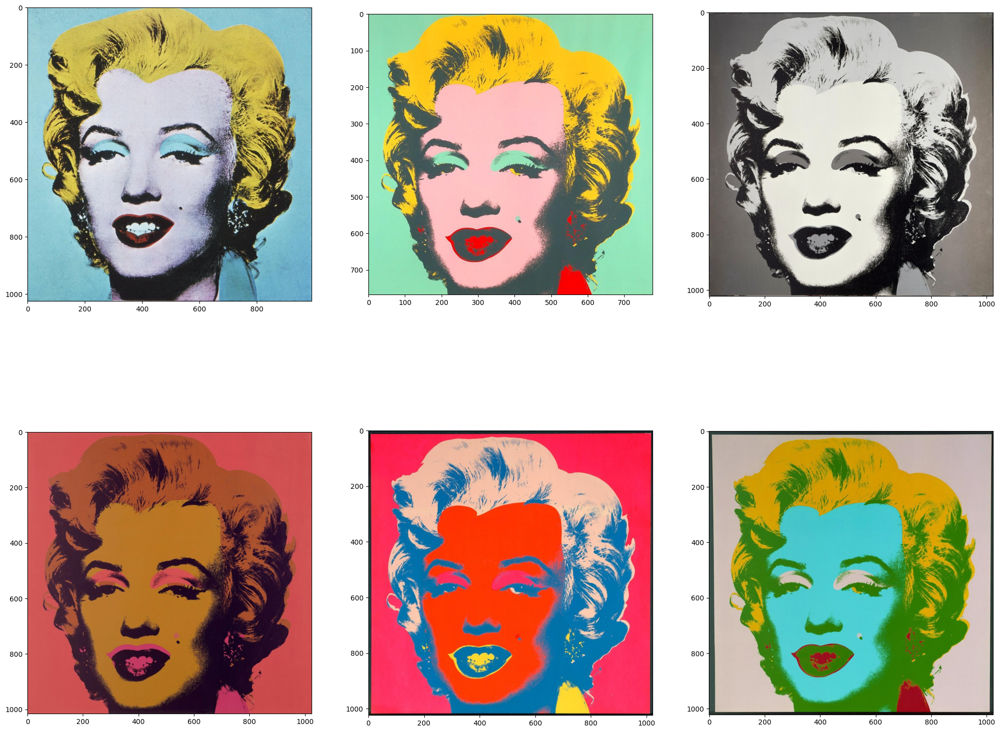

In [4]:
def plot_shot_marilyns(filepaths):
  """
  This function plots the images located in the given filepaths.
  It creates a figure with a height of 20 and a width of 25.
  The images are arranged in a 2x3 grid. For each filepath, the function reads the image and places it in the appropriate position on the grid.
  The final image in the bottom right corner is turned off.
  Simply call the function with the appropriate filepaths to display the images.

  """
  fig, ax = plt.subplots(2,3)
  fig.set_figheight(20)
  fig.set_figwidth(25)
  row_, col_ = -1, 0
  for i, filepath in enumerate(filepaths):
    img_ = skio.imread(filepath)
    row_, col_ = (row_ + 1,  0) if (i%3 == 0) else (row_,  col_ + 1)
    ax[row_, col_].imshow(img_)
  ax[1,2].set_axis_off()

plot_shot_marilyns(image_links)

# Entropy

In [ ]:
def entropy(Y):
    """
    Also known as Shanon Entropy
    Reference: https://en.wikipedia.org/wiki/Entropy_(information_theory)
    """
    unique, count = np.unique(Y, return_counts=True, axis=0)
    prob = count/len(Y)
    en = np.sum((-1)*prob*np.log2(prob))
    return en


#Joint Entropy
def jEntropy(Y,X):
    """
    H(Y;X)
    Reference: https://en.wikipedia.org/wiki/Joint_entropy
    """
    YX = np.c_[Y,X]
    return entropy(YX)

#Conditional Entropy
def cEntropy(Y, X):
    """
    conditional entropy = Joint Entropy - Entropy of X
    H(Y|X) = H(Y;X) - H(X)
    Reference: https://en.wikipedia.org/wiki/Conditional_entropy
    """
    return jEntropy(Y, X) - entropy(X)

In [ ]:
def extract_image(image_link, resize_shape=(512, 512), image=True, image_matrix=False):
    '''
    This function extracts and resizes the image to 512x512 pixels.
    The argument includes the image link, set image=True to get the image itself,
    and set image_matrix=True to get the image RGB matrix.
    '''
    response = requests.get(image_link)
    img = Image.open(BytesIO(response.content))

    # Resize the image
    img_resized = img.resize(resize_shape)

    if image and not image_matrix:
        return img_resized
    if image_matrix:
        image_matrix = np.array(img_resized)
        return image_matrix

def extract_channal(image_array, color_component):
    '''
    This function will extract the channal of Red, Green, and Blue
    '''
    # Get the index of the chosen color component
    color_index = ["R", "G", "B"].index(color_component)

    # Flatten the array to a 2D shape
    flattened_array = image_array.reshape(-1, 4)

    # Extract the color component values
    color_values = flattened_array[:, color_index]
    return color_values

def distribution_plot(image):
    image_matrix = np.array(image)
    red_channel = image_matrix[:,:,0]
    green_channel = image_matrix[:,:,1]
    blue_channel = image_matrix[:,:,2]
    red_hist = np.histogram(red_channel, bins=256, range=(0, 256))[0]
    green_hist = np.histogram(green_channel, bins=256, range=(0, 256))[0]
    blue_hist = np.histogram(blue_channel, bins=256, range=(0, 256))[0]

    # Normalize the histograms to obtain probabilities
    total_pixels = image_matrix.shape[0] * image_matrix.shape[1]
    red_prob = red_hist / total_pixels
    green_prob = green_hist / total_pixels
    blue_prob = blue_hist / total_pixels

    plt.figure(figsize=(5, 4.5))
    plt.plot(red_prob, color='red')
    plt.plot(green_prob, color='green')
    plt.plot(blue_prob, color='blue')
    plt.xlabel('Channel')
    plt.ylabel('Probability')
    plt.ylim(0, 0.33)
    plt.show()

def conditional_entropy_table(image_array):
    color_values_R = extract_channal(image_array, color_component='R')
    color_values_G = extract_channal(image_array, color_component='G')
    color_values_B = extract_channal(image_array, color_component='B')

    RB = cEntropy(color_values_R, color_values_B)/entropy(color_values_R)

    RG = cEntropy(color_values_R, color_values_G)/entropy(color_values_R)

    RR = cEntropy(color_values_R, color_values_R)/entropy(color_values_R)

    BR = cEntropy(color_values_B, color_values_R)/entropy(color_values_B)

    BG = cEntropy(color_values_B, color_values_G)/entropy(color_values_B)

    BB = cEntropy(color_values_B, color_values_B)/entropy(color_values_B)

    GB = cEntropy(color_values_G, color_values_B)/entropy(color_values_G)

    GR = cEntropy(color_values_G, color_values_R)/entropy(color_values_G)

    GG = cEntropy(color_values_G, color_values_G)/entropy(color_values_G)

    # Probability values for each cell (example values)
    probabilities = np.array([[RR, round(RG, 3), round(RB, 3)],
                              [round(GR, 3), GG, round(GB, 3)],
                              [round(BR, 3), round(BG, 3), BB]])

    # Create a figure and axis
    fig, ax = plt.subplots()

    # Create the heatmap
    heatmap = heatmap = ax.imshow(probabilities, cmap='Reds', vmin=0, vmax=1)

    # Set the colorbar
    cbar = plt.colorbar(heatmap)

    # Set the tick labels
    ax.set_xticks(np.arange(3))
    ax.set_yticks(np.arange(3))
    ax.set_xticklabels(['red', 'green', 'blue'])  # Replace with your desired x-axis labels
    ax.set_yticklabels(['red', 'green', 'blue'])  # Replace with your desired y-axis labels

    # Loop over the data and create text annotations for each cell
    for i in range(3):
        for j in range(3):
            text = ax.text(j, i, probabilities[i, j], ha='center', va='center', color='black')
    # Set the axis labels
    #ax.set_xlabel('X-Axis Label')
    #ax.set_ylabel('Y-Axis Label')

    # Set the title
    #ax.set_title('Conditional Entropy of Image 1')

    # Display the heatmap
    plt.show()

In [ ]:
image0 = extract_image(image_link = image_links[0], image=True,image_matrix=False)
image_array0 = extract_image(image_link = image_links[0], image=False,image_matrix=True)
image1 = extract_image(image_link = image_links[1], image=True,image_matrix=False)
image_array1 = extract_image(image_link = image_links[1], image=False,image_matrix=True)
image2 = extract_image(image_link = image_links[2], image=True,image_matrix=False)
image_array2 = extract_image(image_link = image_links[2], image=False,image_matrix=True)
image3 = extract_image(image_link = image_links[3], image=True,image_matrix=False)
image_array3 = extract_image(image_link = image_links[3], image=False,image_matrix=True)
image4 = extract_image(image_link = image_links[4], image=True,image_matrix=False)
image_array4 = extract_image(image_link = image_links[4], image=False,image_matrix=True)

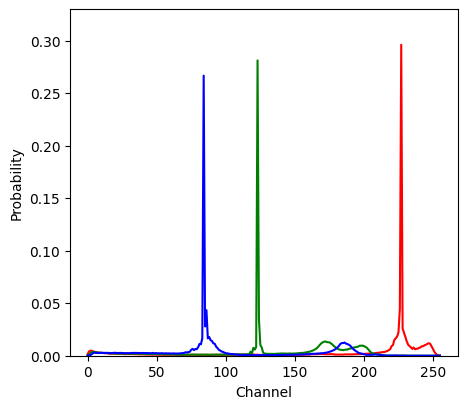

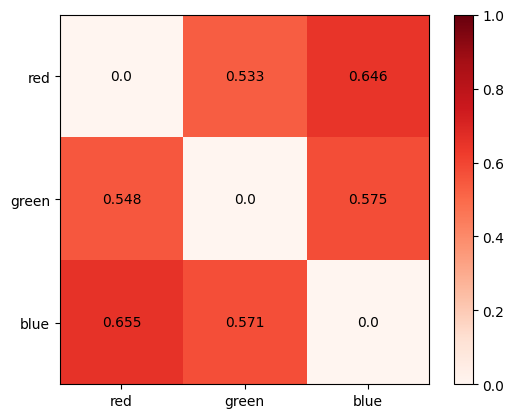

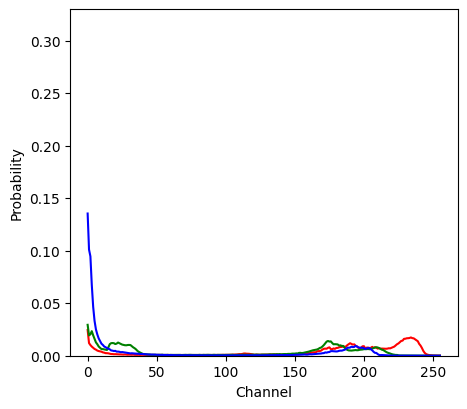

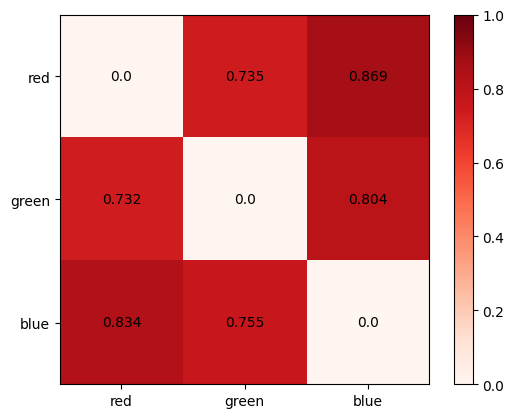

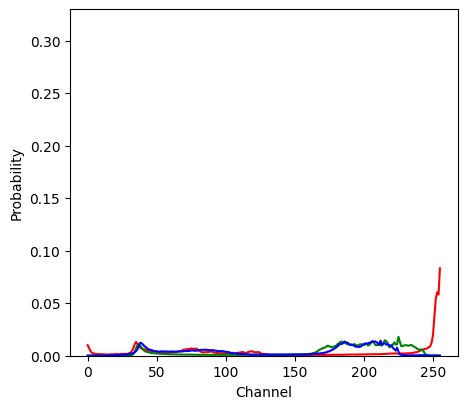

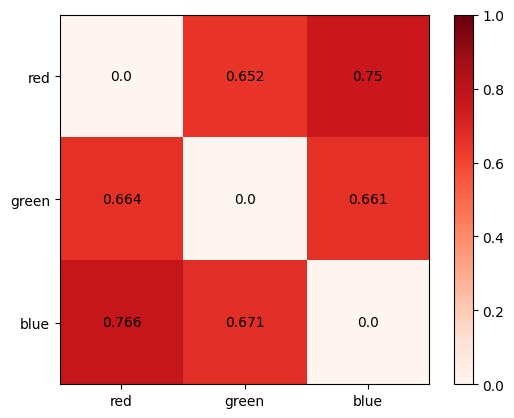

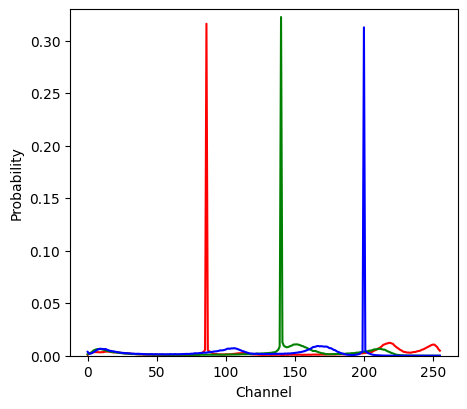

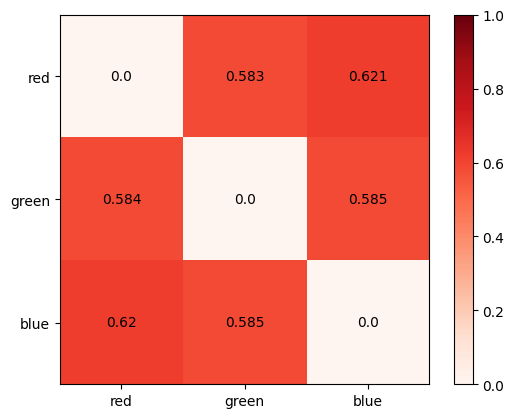

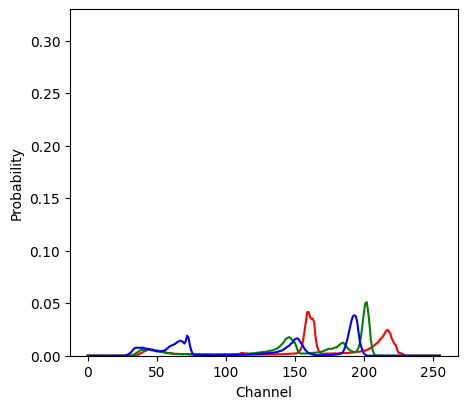

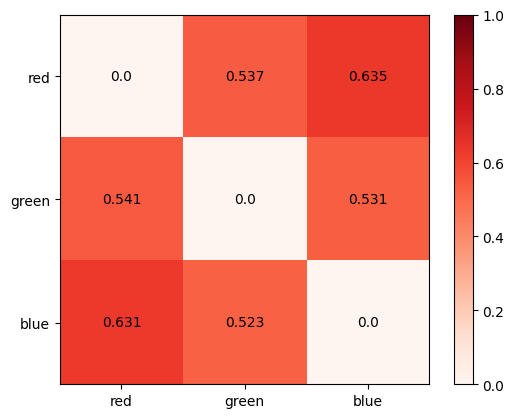

In [ ]:
distribution_plot(image0)
conditional_entropy_table(image_array0)
distribution_plot(image1)
conditional_entropy_table(image_array1)
distribution_plot(image2)
conditional_entropy_table(image_array2)
distribution_plot(image3)
conditional_entropy_table(image_array3)
distribution_plot(image4)
conditional_entropy_table(image_array4)

# 2D Space

In [ ]:
image_matrix0 = extract_image(image_link = image_links[0], image=False,image_matrix=True)
R0 = pd.DataFrame(extract_channal(image_matrix0, 'R')).rename(columns={0: "R0"})
G0 = pd.DataFrame(extract_channal(image_matrix0, 'G')).rename(columns={0: "G0"})
B0 = pd.DataFrame(extract_channal(image_matrix0, 'B')).rename(columns={0: "B0"})
RGB0df = pd.concat([R0,G0,B0], axis=1)
RGB0df

image_matrix1 = extract_image(image_link = image_links[1], image=False,image_matrix=True)
R1 = pd.DataFrame(extract_channal(image_matrix1, 'R')).rename(columns={0: "R1"})
G1 = pd.DataFrame(extract_channal(image_matrix1, 'G')).rename(columns={0: "G1"})
B1 = pd.DataFrame(extract_channal(image_matrix1, 'B')).rename(columns={0: "B1"})
RGB1df = pd.concat([R1,G1,B1], axis=1)
RGB1df

image_matrix2 = extract_image(image_link = image_links[2], image=False,image_matrix=True)
R2 = pd.DataFrame(extract_channal(image_matrix2, 'R')).rename(columns={0: "R2"})
G2 = pd.DataFrame(extract_channal(image_matrix2, 'G')).rename(columns={0: "G2"})
B2 = pd.DataFrame(extract_channal(image_matrix2, 'B')).rename(columns={0: "B2"})
RGB2df = pd.concat([R2,G2,B2], axis=1)
RGB2df

image_matrix3 = extract_image(image_link = image_links[3], image=False,image_matrix=True)
#R3 = pd.DataFrame(extract_channal(image_matrix3, 'R')).rename(columns={0: "R3"})
#G3 = pd.DataFrame(extract_channal(image_matrix3, 'G')).rename(columns={0: "G3"})
#B3 = pd.DataFrame(extract_channal(image_matrix3, 'B')).rename(columns={0: "B3"})
RGB3df = pd.DataFrame(image_matrix3.reshape(-1, 3)).rename(columns={0: "R3", 1: "G3", 2: "B3"})
RGB3df
#RGB3df = pd.concat([R3,G3,B3], axis=1)
#RGB3df

image_matrix4 = extract_image(image_link = image_links[4], image=False,image_matrix=True)
R4 = pd.DataFrame(extract_channal(image_matrix4, 'R')).rename(columns={0: "R4"})
G4 = pd.DataFrame(extract_channal(image_matrix4, 'G')).rename(columns={0: "G4"})
B4 = pd.DataFrame(extract_channal(image_matrix4, 'B')).rename(columns={0: "B4"})
RGB4df = pd.concat([R4,G4,B4], axis=1)
RGB4df

rgb_df = pd.concat([RGB0df,RGB1df,RGB2df,RGB3df,RGB4df], axis=1)
rgb_df

,R0,G0,B0,R1,G1,B1,R2,G2,B2,R3,G3,B3,R4,G4,B4
0,216,114,106,178,26,7,92,197,190,86,140,200,150,184,172
1,227,113,99,177,24,7,88,194,187,86,140,200,151,186,174
2,215,123,95,176,21,6,89,193,187,86,140,200,149,185,173
3,225,117,71,174,15,1,91,192,187,86,140,200,152,187,175
4,227,118,71,172,11,0,89,189,186,86,140,200,155,189,177
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
262139,207,126,86,178,34,6,1,165,164,86,140,200,157,192,180
262140,219,123,73,177,36,6,1,165,164,86,140,200,156,190,179
262141,218,125,79,174,35,4,1,165,164,86,140,200,156,189,178
262142,219,123,73,171,35,3,2,165,164,86,140,200,154,189,178


In [ ]:
def axis_mask(val, base):
    """
    Construct sliding kernel for centers based on cube dimension i.e base
    """
    if val == 0:
        inf_mask = 0
        sup_mask = base
    elif val == base:
        inf_mask = 0
        sup_mask = base
    elif val % base == 0:
        inf_mask = val - base
        sup_mask = val
    else:
        inf_mask = base * np.floor(val/base) # closest mulitple of
        sup_mask = base * np.ceil(val/base)
    return((int(inf_mask), int(sup_mask)))


def get_bounding_cubes(data, step = 3):
    """
    Get centers using mask
    """
    data_masks = []
    mask_center = []
    for pos, row in tqdm(enumerate(data), total=len(data)):
        x_mask = axis_mask(val=row[0], base=step )
        y_mask = axis_mask(val=row[1], base=step )
        z_mask = axis_mask(val=row[2], base=step)
        center_x = np.median(range(x_mask[0], x_mask[1] + 1))
        center_y = np.median(range(y_mask[0], y_mask[1] + 1))
        center_z = np.median(range(z_mask[0], z_mask[1] + 1))
        data_masks.append((x_mask,y_mask, z_mask))
        mask_center.append((int(center_x), int(center_y), int(center_z)))

    return(data, data_masks, mask_center)

In [ ]:
gbc0 = get_bounding_cubes(rgb_df[["R0", "G0", "B0"]].values, step = 3)
gbc1 = get_bounding_cubes(rgb_df[["R1", "G1", "B1"]].values, step = 3)
gbc2 = get_bounding_cubes(rgb_df[["R2", "G2", "B2"]].values, step = 3)
gbc3 = get_bounding_cubes(rgb_df[["R3", "G3", "B3"]].values, step = 3)
gbc4 = get_bounding_cubes(rgb_df[["R4", "G4", "B4"]].values, step = 3)

  0%|          | 0/262144 [00:00<?, ?it/s]

  0%|          | 0/262144 [00:00<?, ?it/s]

  0%|          | 0/262144 [00:00<?, ?it/s]

  0%|          | 0/262144 [00:00<?, ?it/s]

  0%|          | 0/262144 [00:00<?, ?it/s]

In [ ]:
center_df0 = pd.DataFrame(gbc0[2])
#rgb_df.columns[3:6]
center_df0.columns = [col + ' center' for col in rgb_df.columns][0:3]
center_df0

center_df1 = pd.DataFrame(gbc1[2])
#rgb_df.columns[3:6]
center_df1.columns = [col + ' center' for col in rgb_df.columns][3:6]
center_df1

center_df2 = pd.DataFrame(gbc2[2])
#rgb_df.columns[3:6]
center_df2.columns = [col + ' center' for col in rgb_df.columns][6:9]
center_df2

center_df3 = pd.DataFrame(gbc3[2])
#rgb_df.columns[3:6]
center_df3.columns = [col + ' center' for col in rgb_df.columns][9:12]
center_df3

center_df4 = pd.DataFrame(gbc4[2])
#rgb_df.columns[3:6]
center_df4.columns = [col + ' center' for col in rgb_df.columns][12:15]
center_df4

,R4 center,G4 center,B4 center
0,148,184,172
1,151,184,172
2,148,184,172
3,151,187,175
4,154,187,175
...,...,...,...
262139,157,190,178
262140,154,190,178
262141,154,187,178
262142,154,187,178


In [ ]:
import scipy.cluster.hierarchy as sch
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable


def rgb2hex(rgb):
  """
  Convert RGB to hexadecimal
  """
  try:
    r, g, b = tuple(rgb)
    return "#{:02x}{:02x}{:02x}".format(int(r),int(g),int(b))
  except:
    print(f'failed rgb {rgb}')

def make_plot_dendogram(df, rgb_cols, cluster_color_col, link):
    df_ = df.copy()
    clustered_leaf_labels = df_[cluster_color_col].values
    unclustered_leaf_labels = list(map(rgb2hex, df_[rgb_cols].values))

    plt.clf()
    fig = plt.figure(figsize=(25, 10))
    dn = sch.dendrogram(link )
    ax = plt.gca()

    x_points = ax.get_xticks()
    y_points = np.zeros(len(x_points))
    xlbls = ax.get_xmajorticklabels()
  # print(ax.get_position())
    color_idx = []
    clustered_colors_list = []
    unclustered_colors_list = []

  # retrieve clustered colors and unclustered colors
    for lbl in xlbls:
        color_idx.append(int(lbl.get_text()))
        clustered_colors_list.append(clustered_leaf_labels[int(lbl.get_text())])
        unclustered_colors_list.append(unclustered_leaf_labels[int(lbl.get_text())])
  # get axis position [x0,y0,width,height]
    ax_bbox = ax.get_position()
    cax1 = fig.add_axes([ax_bbox.x0, 0.01, ax_bbox.width, 0.05])

  # create custom colorbar
    cm1 = LinearSegmentedColormap.from_list('custom_colormap', clustered_colors_list, N=len(clustered_colors_list))
    sc1 = plt.scatter(x_points, y_points, c=color_idx, cmap=cm1)
    clustered_cb = plt.colorbar(sc1, cax=cax1,  orientation='horizontal')

  # set the size of nex axis [x0,y0,width,height]
    cax2 = fig.add_axes([ax_bbox.x0, 0.065, ax_bbox.width, 0.05])
    cm2 = LinearSegmentedColormap.from_list('custom_colormap', unclustered_colors_list, N=len(unclustered_colors_list))
    sc2 = plt.scatter(x_points, y_points, c=color_idx, cmap=cm2)
    unclustered_cb = plt.colorbar(sc2, cax=cax2,  orientation='horizontal', pad = 0.3)

  # remove ticks and labels
    ax.set_xticklabels([])

  # clustered_cb.ax.set_ylabel(ylabel='Clustered', rotation=270, loc='center', fontsize=20, labelpad=25)
  # unclustered_cb.ax.set_ylabel(ylabel='Unclustered', rotation=270, loc='center', fontsize=20, labelpad=25)
    clustered_cb.ax.tick_params(size=0)
    unclustered_cb.ax.tick_params(size=0)
    clustered_cb.ax.set_xticklabels([])
    unclustered_cb.ax.set_xticklabels([])
    plt.show()

def ColorsSequence3DScatterPerCluster(df):
    df_ = df.copy()
    clusters = df_['Clusters'].drop_duplicates()
    for ii in range(clusters.shape[0]):
        colors = df_.query('Clusters == {}'.format(ii))
        color_rep = colors.sample(n=1, random_state = 1).values
        color_rep = color_rep[0][0:3]
        df_.loc[df_['Clusters'] == ii, 'ClusterColor'] = rgb2hex(color_rep)

    return df_

def mapClusters(df, link, n_clusters = 2, height = None):
    df_ = df.copy()
    if height == None:
        clusters = sch.cut_tree(Z=link, n_clusters=n_clusters)
    else:
        clusters = sch.cut_tree(Z=link, height = height)
    df_['Clusters'] = clusters
    return df_

def cluster_center(df, center_cols, n_cluster, plot_dendogram = True):
    df_ = df.copy()
    df_center_unique = df_[center_cols].drop_duplicates()
    link = sch.linkage(df_center_unique, method='ward')
    df_center_unique = ColorsSequence3DScatterPerCluster(mapClusters(df_center_unique, link, n_cluster))
    df__ = pd.merge(df_, df_center_unique, how='right', on=center_cols).drop_duplicates(subset=center_cols)
    df_ = pd.merge(df_, df_center_unique, how='left', on=center_cols)

    if plot_dendogram:
        make_plot_dendogram(df=df__, rgb_cols=center_cols, cluster_color_col='ClusterColor', link=link)
    return(df_)


In [ ]:
center_df_all0 = pd.concat([rgb_df[["R0", "G0", "B0"]], center_df0], axis=1)
center_df_all1 = pd.concat([rgb_df[["R1", "G1", "B1"]], center_df1], axis=1)
center_df_all2 = pd.concat([rgb_df[["R2", "G2", "B2"]], center_df2], axis=1)
center_df_all3 = pd.concat([rgb_df[["R3", "G3", "B3"]], center_df3], axis=1)
center_df_all4 = pd.concat([rgb_df[["R4", "G4", "B4"]], center_df4], axis=1)

<Figure size 640x480 with 0 Axes>

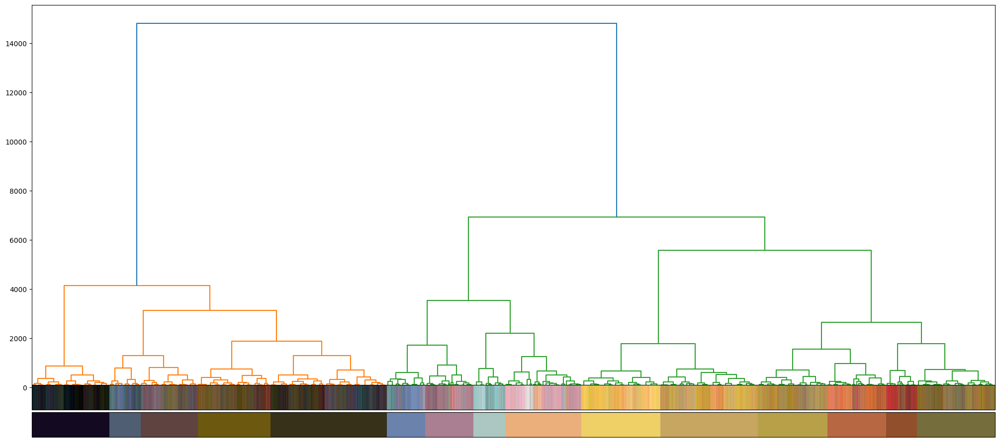

,R0,G0,B0,R0 center,G0 center,B0 center,Clusters,ClusterColor
0,216,114,106,214,112,106,0,#a97f91
1,227,113,99,226,112,97,1,#b86743
2,215,123,95,214,121,94,1,#b86743
3,225,117,71,223,115,70,1,#b86743
4,227,118,71,226,118,70,1,#b86743
5,227,118,71,226,118,70,1,#b86743


In [ ]:
# plot the dendogram of unique centers and their chosen representative color. Representative via random sampling. You may want to experiement with
# other way of getting a representative e.g average of all the RGB in that cluster
cluster_center_df0 = cluster_center(df=center_df_all0, center_cols=['R0 center', 'G0 center', 'B0 center'], n_cluster=15)
cluster_center_df0.head(6)

<Figure size 640x480 with 0 Axes>

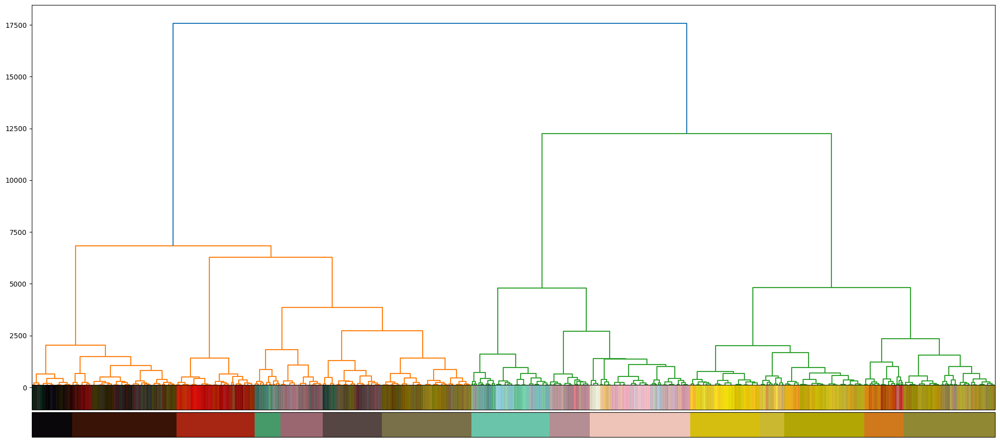

,R1,G1,B1,R1 center,G1 center,B1 center,Clusters,ClusterColor
0,178,26,7,178,25,7,0,#a62513
1,177,24,7,175,22,7,0,#a62513
2,176,21,6,175,19,4,0,#a62513
3,174,15,1,172,13,1,0,#a62513
4,172,11,0,172,10,1,0,#a62513
5,175,13,0,175,13,1,0,#a62513


In [ ]:
cluster_center_df1 = cluster_center(df=center_df_all1, center_cols=['R1 center', 'G1 center', 'B1 center'], n_cluster=15)
cluster_center_df1.head(6)

<Figure size 640x480 with 0 Axes>

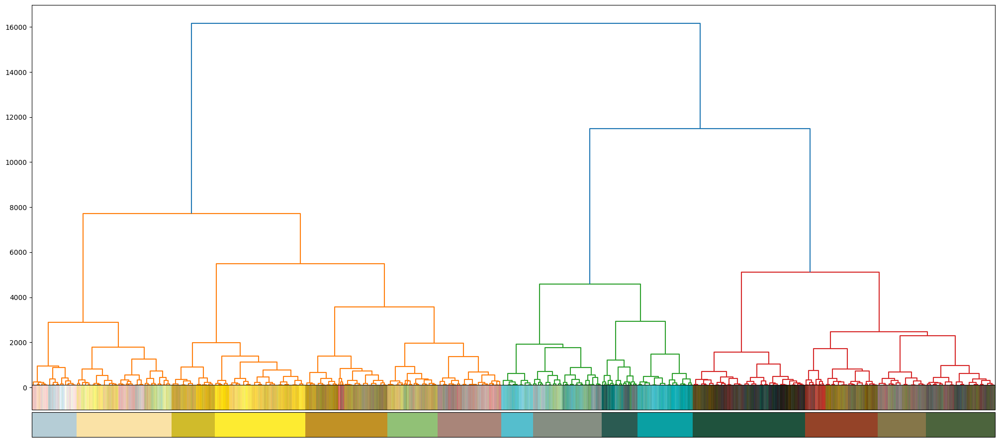

,R2,G2,B2,R2 center,G2 center,B2 center,Clusters,ClusterColor
0,92,197,190,91,196,190,0,#55becd
1,88,194,187,88,193,187,0,#55becd
2,89,193,187,88,193,187,0,#55becd
3,91,192,187,91,190,187,0,#55becd
4,89,189,186,88,187,184,0,#55becd
5,88,188,186,88,187,184,0,#55becd


In [ ]:
cluster_center_df2 = cluster_center(df=center_df_all2, center_cols=['R2 center', 'G2 center', 'B2 center'], n_cluster=15)
cluster_center_df2.head(6)

<Figure size 640x480 with 0 Axes>

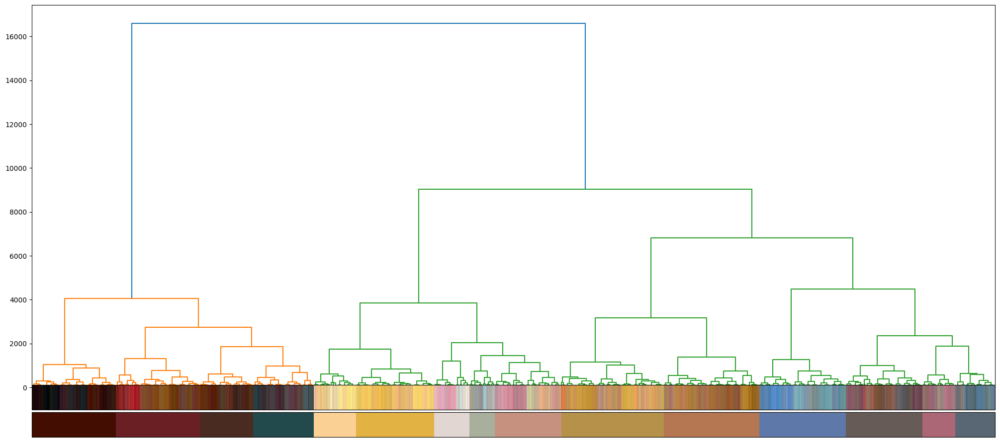

,R3,G3,B3,R3 center,G3 center,B3 center,Clusters,ClusterColor
0,86,140,200,85,139,199,0,#5e79a9
1,86,140,200,85,139,199,0,#5e79a9
2,86,140,200,85,139,199,0,#5e79a9
3,86,140,200,85,139,199,0,#5e79a9
4,86,140,200,85,139,199,0,#5e79a9
5,86,140,200,85,139,199,0,#5e79a9


In [ ]:
cluster_center_df3 = cluster_center(df=center_df_all3, center_cols=['R3 center', 'G3 center', 'B3 center'], n_cluster=15)
cluster_center_df3.head(6)

<Figure size 640x480 with 0 Axes>

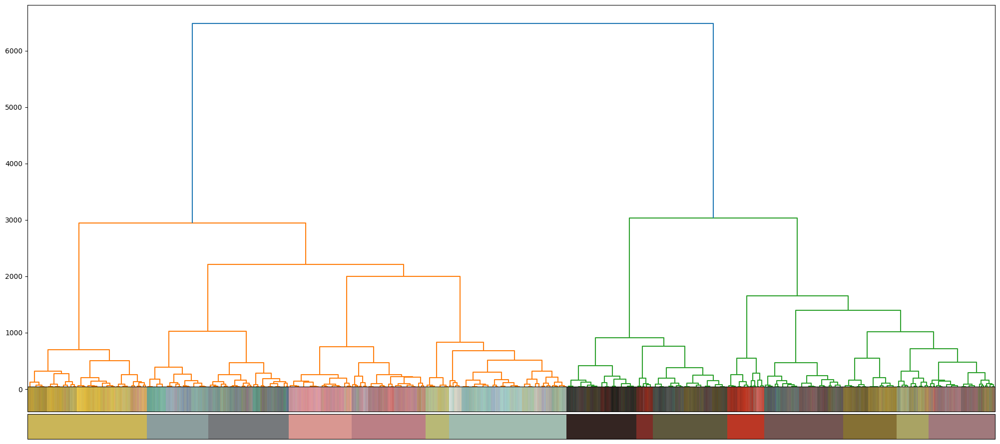

,R4,G4,B4,R4 center,G4 center,B4 center,Clusters,ClusterColor
0,150,184,172,148,184,172,0,#a0bbaf
1,151,186,174,151,184,172,0,#a0bbaf
2,149,185,173,148,184,172,0,#a0bbaf
3,152,187,175,151,187,175,0,#a0bbaf
4,155,189,177,154,187,175,0,#a0bbaf
5,156,189,178,154,187,178,0,#a0bbaf


In [ ]:
cluster_center_df4 = cluster_center(df=center_df_all4, center_cols=['R4 center', 'G4 center', 'B4 center'], n_cluster=15)
cluster_center_df4.head(6)

In [ ]:
def plot_colours_cluster(df, c1, c2, c3):
    """
    Given a DataFrame and three column names,
    plot the pairs against each other
    """
    fig, ax = plt.subplots(1, 3)
    fig.set_size_inches(18, 6)
    df.plot.scatter(c1, c2, c=df["ClusterColor"], alpha=0.3, ax=ax[0])
    df.plot.scatter(c1, c3, c=df["ClusterColor"], alpha=0.3, ax=ax[1])
    df.plot.scatter(c2, c3, c=df["ClusterColor"], alpha=0.3, ax=ax[2])

# Image 0 - Orange

In [ ]:
import webcolors
lst_color = []
n = len(center_df0)
for i in range(0,n):
    color_name = webcolors.rgb_to_hex((center_df0["R0 center"][i].astype(int),center_df0["G0 center"][i].astype(int),center_df0["B0 center"][i].astype(int)))
    lst_color.append(color_name)
center_df0['colour'] = lst_color

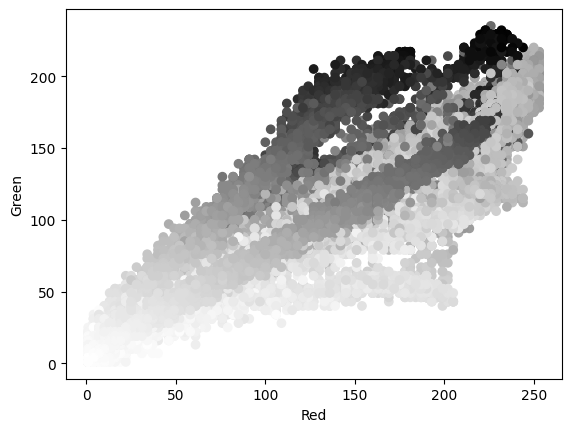

In [ ]:
plt.xlabel("Red")
plt.ylabel("Green")
plt.scatter(center_df0["R0 center"], center_df0["G0 center"], c=center_df0["B0 center"], cmap='Greys')

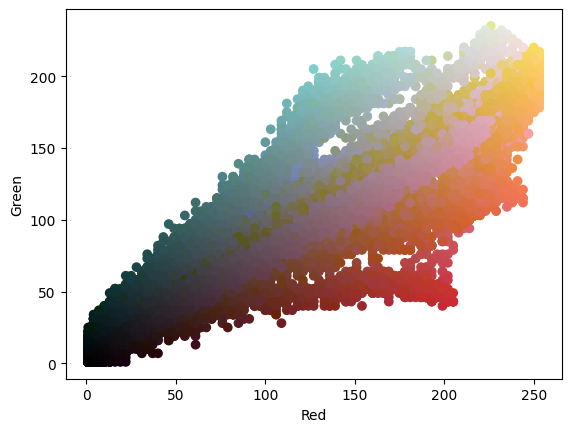

In [ ]:
plt.xlabel("Red")
plt.ylabel("Green")
plt.scatter(center_df0["R0 center"], center_df0["G0 center"], c=center_df0["colour"])

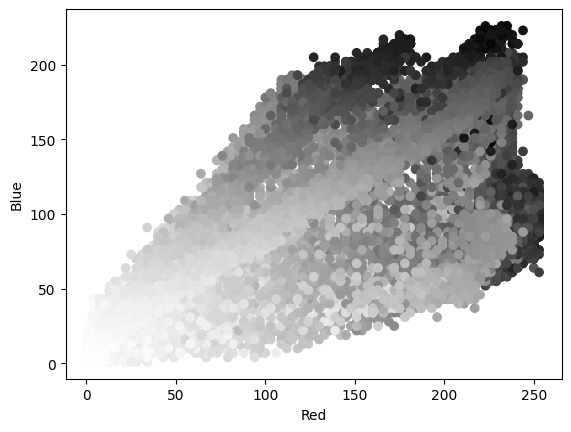

In [ ]:
plt.xlabel("Red")
plt.ylabel("Blue")
plt.scatter(center_df0["R0 center"], center_df0["B0 center"], c=center_df0["G0 center"], cmap='Greys')

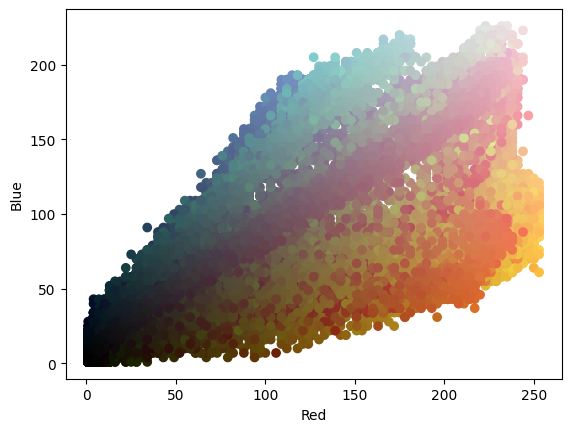

In [ ]:
plt.xlabel("Red")
plt.ylabel("Blue")
plt.scatter(center_df0["R0 center"], center_df0["B0 center"], c=center_df0["colour"])

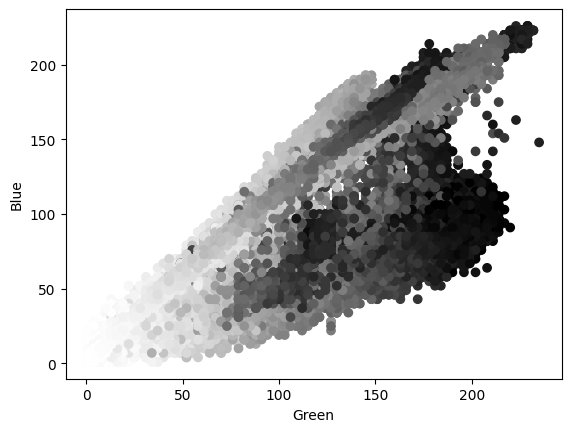

In [ ]:
plt.xlabel("Green")
plt.ylabel("Blue")
plt.scatter(center_df0["G0 center"], center_df0["B0 center"],  c=center_df0["R0 center"], cmap='Greys')

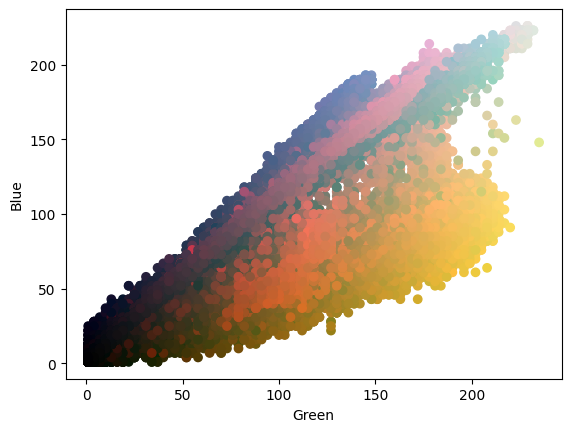

In [ ]:
plt.xlabel("Green")
plt.ylabel("Blue")
plt.scatter(center_df0["G0 center"], center_df0["B0 center"],  c=center_df0["colour"])

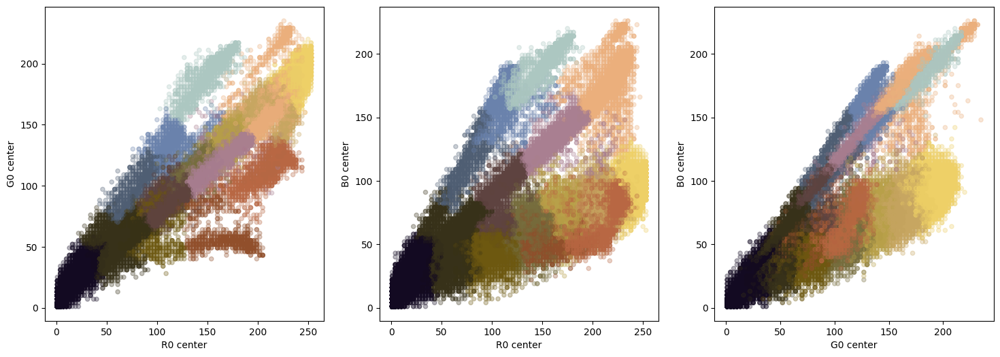

In [ ]:
plot_colours_cluster(cluster_center_df0, "R0 center", "G0 center","B0 center")

# Image 1 - Red

In [ ]:
n = len(center_df1)
lst_color = []
for i in range(0,n):
    color_name = webcolors.rgb_to_hex((center_df1['R1 center'][i].astype(int),center_df1['G1 center'][i].astype(int),center_df1['B1 center'][i].astype(int)))
    lst_color.append(color_name)
center_df1['colour'] = lst_color

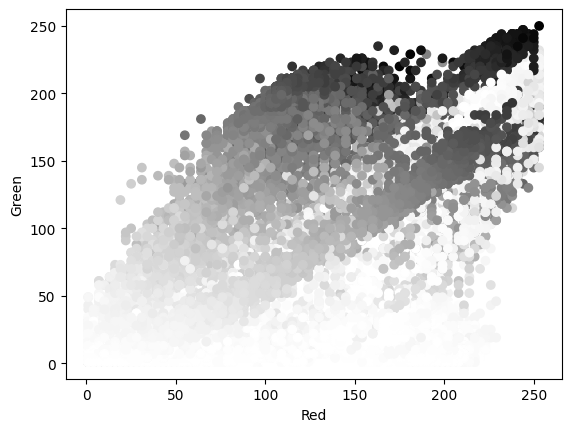

In [ ]:
plt.xlabel("Red")
plt.ylabel("Green")
plt.scatter(center_df1["R1 center"], center_df1["G1 center"], c=center_df1["B1 center"], cmap='Greys')

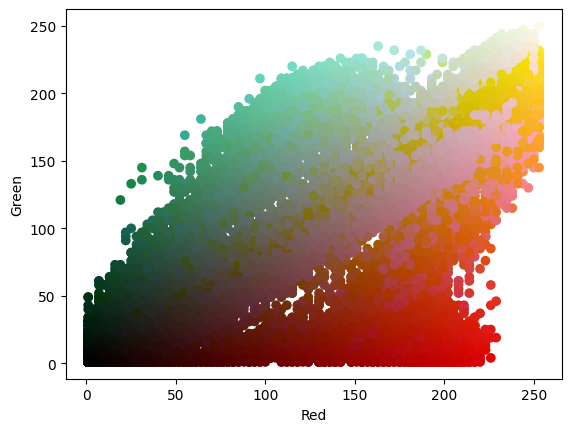

In [ ]:
plt.xlabel("Red")
plt.ylabel("Green")
plt.scatter(center_df1["R1 center"], center_df1["G1 center"], c=center_df1["colour"])

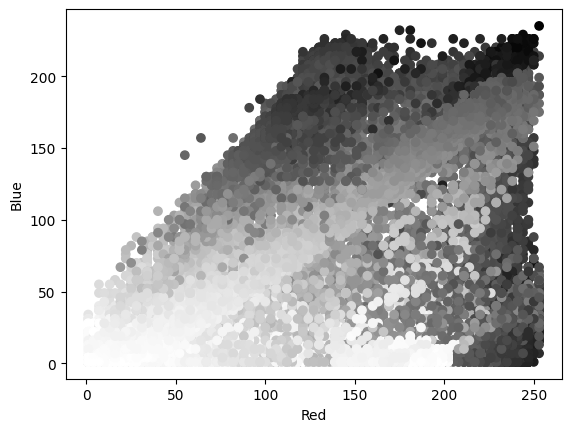

In [ ]:
plt.xlabel("Red")
plt.ylabel("Blue")
plt.scatter(center_df1["R1 center"], center_df1["B1 center"], c=center_df1["G1 center"], cmap='Greys')

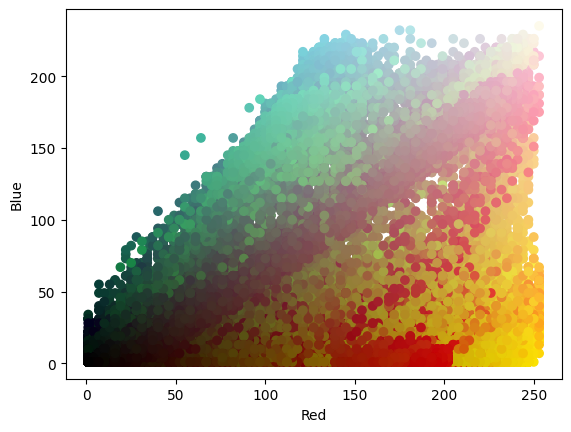

In [ ]:
plt.xlabel("Red")
plt.ylabel("Blue")
plt.scatter(center_df1["R1 center"], center_df1["B1 center"], c=center_df1["colour"])

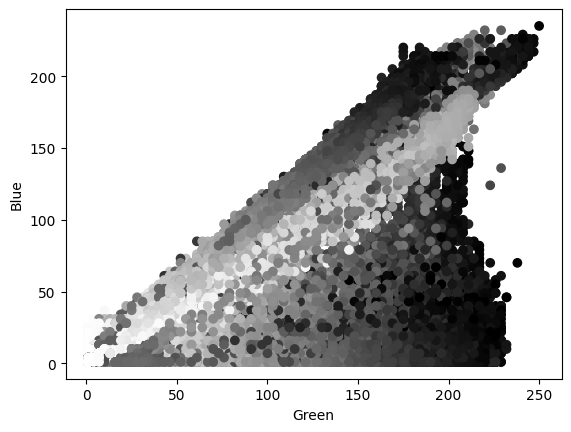

In [ ]:
plt.xlabel("Green")
plt.ylabel("Blue")
plt.scatter(center_df1["G1 center"], center_df1["B1 center"], c=center_df1["R1 center"], cmap='Greys')

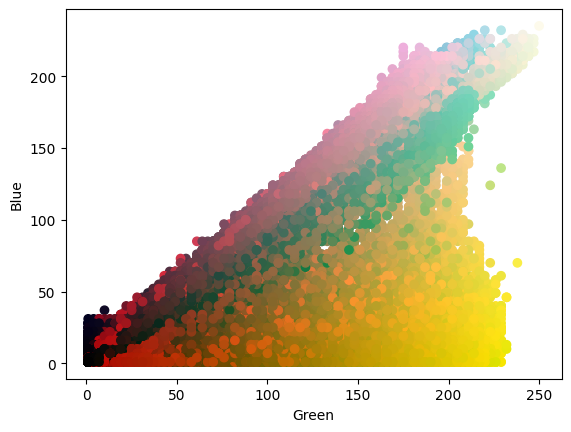

In [ ]:
plt.xlabel("Green")
plt.ylabel("Blue")
plt.scatter(center_df1["G1 center"], center_df1["B1 center"], c=center_df1["colour"])

# Image 2 - Turquoise

In [ ]:
n = len(center_df2)
lst_color = []
for i in range(0,n):
    color_name = webcolors.rgb_to_hex((center_df2['R2 center'][i].astype(int),center_df2['G2 center'][i].astype(int),center_df2['B2 center'][i].astype(int)))
    lst_color.append(color_name)
center_df2['colour'] = lst_color

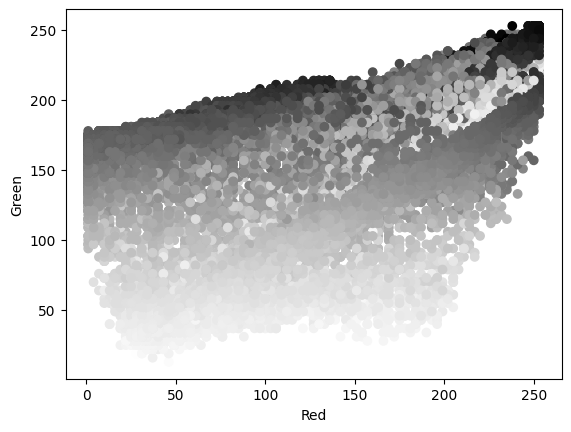

In [ ]:
plt.xlabel("Red")
plt.ylabel("Green")
plt.scatter(center_df2["R2 center"], center_df2["G2 center"], c=center_df2["B2 center"], cmap='Greys')

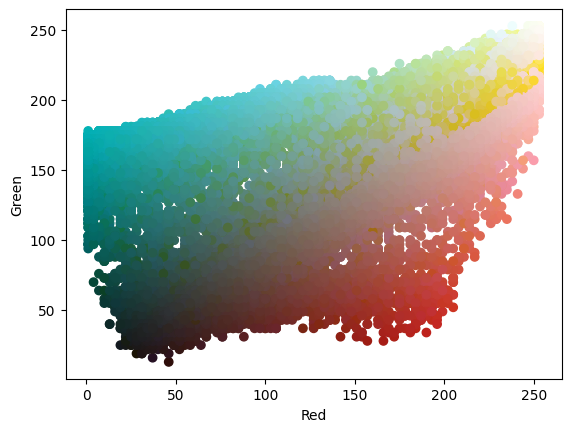

In [ ]:
plt.xlabel("Red")
plt.ylabel("Green")
plt.scatter(center_df2["R2 center"], center_df2["G2 center"], c=center_df2["colour"])

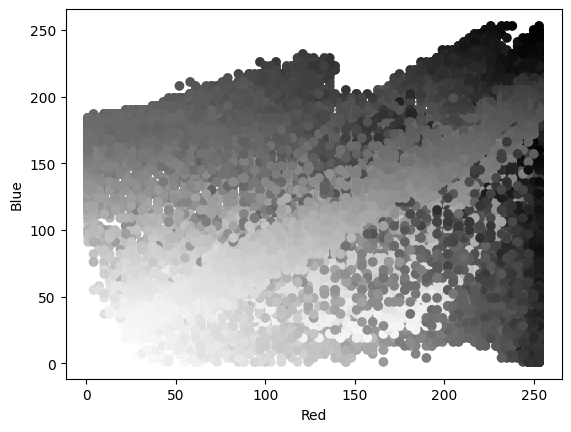

In [ ]:
plt.xlabel("Red")
plt.ylabel("Blue")
plt.scatter(center_df2["R2 center"], center_df2["B2 center"], c=center_df2["G2 center"], cmap='Greys')

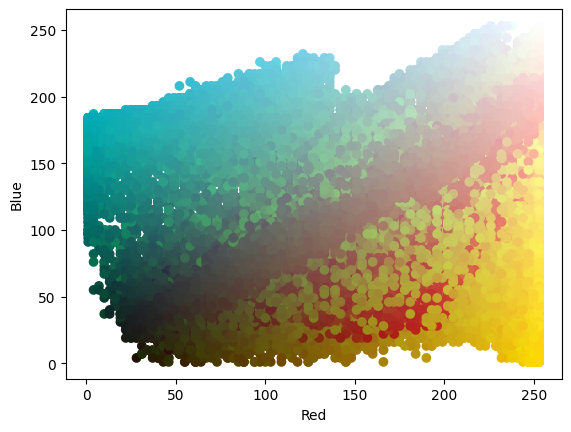

In [ ]:
plt.xlabel("Red")
plt.ylabel("Blue")
plt.scatter(center_df2["R2 center"], center_df2["B2 center"], c=center_df2["colour"])

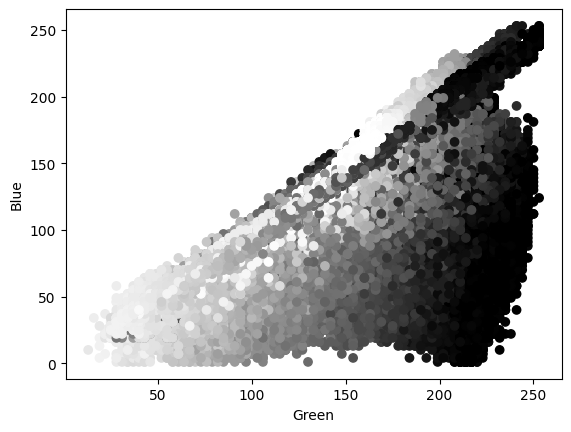

In [ ]:
plt.xlabel("Green")
plt.ylabel("Blue")
plt.scatter(center_df2["G2 center"], center_df2["B2 center"], c=center_df2["R2 center"], cmap='Greys')

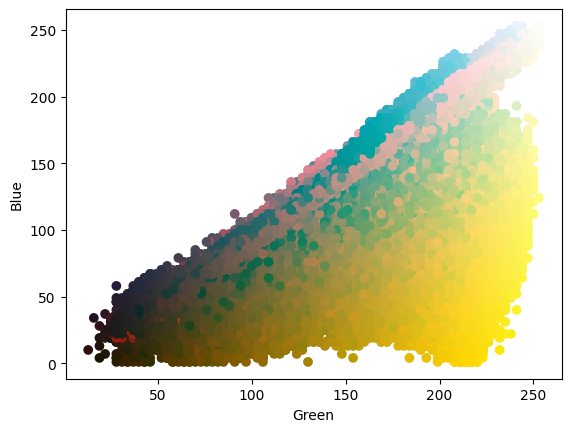

In [ ]:
plt.xlabel("Green")
plt.ylabel("Blue")
plt.scatter(center_df2["G2 center"], center_df2["B2 center"], c=center_df2["colour"])

# Blue

In [ ]:
n = len(center_df3)
lst_color = []
for i in range(0,n):
    color_name = webcolors.rgb_to_hex((center_df3['R3 center'][i].astype(int),center_df3['G3 center'][i].astype(int),center_df3['B3 center'][i].astype(int)))
    lst_color.append(color_name)
center_df3['colour'] = lst_color

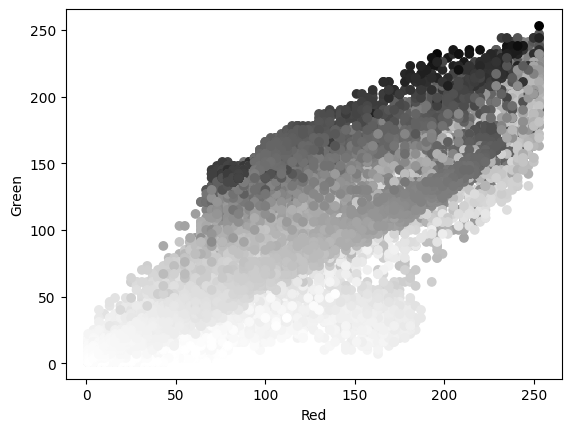

In [ ]:
plt.xlabel("Red")
plt.ylabel("Green")
plt.scatter(center_df3["R3 center"], center_df3["G3 center"], c=center_df3["B3 center"], cmap='Greys')

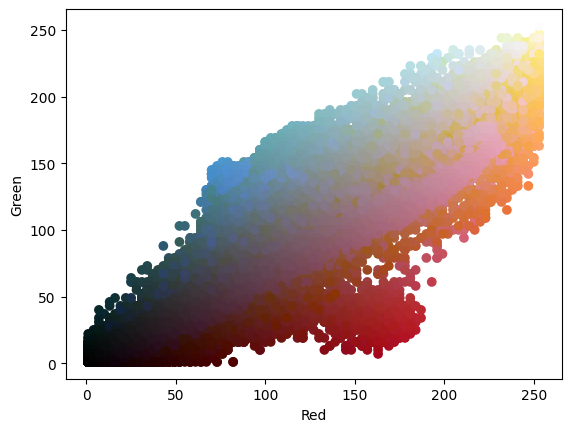

In [ ]:
plt.xlabel("Red")
plt.ylabel("Green")
plt.scatter(center_df3["R3 center"], center_df3["G3 center"], c=center_df3["colour"])

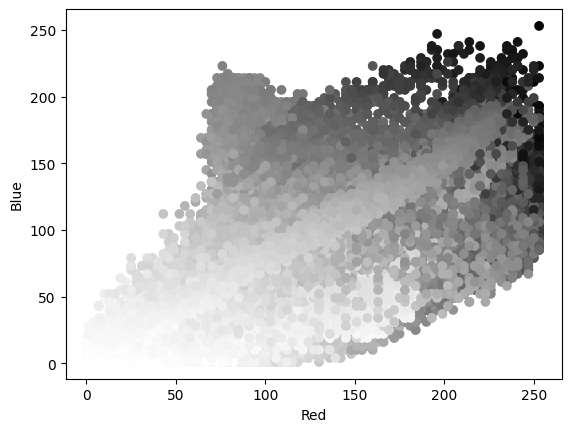

In [ ]:
plt.xlabel("Red")
plt.ylabel("Blue")
plt.scatter(center_df3["R3 center"], center_df3["B3 center"], c=center_df3["G3 center"], cmap='Greys')

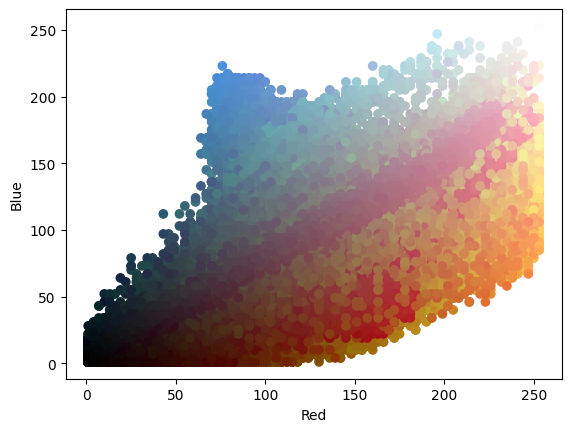

In [ ]:
plt.xlabel("Red")
plt.ylabel("Blue")
plt.scatter(center_df3["R3 center"], center_df3["B3 center"], c=center_df3["colour"])

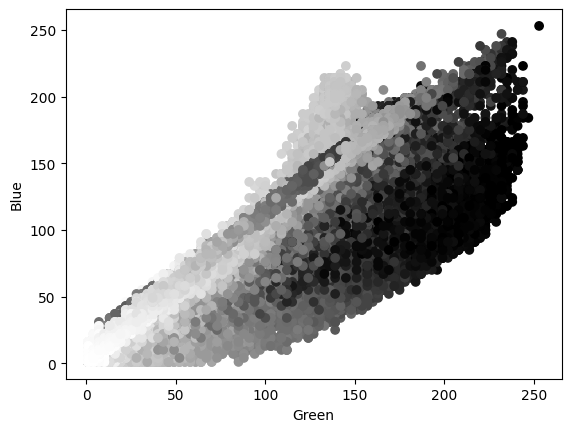

In [ ]:
plt.xlabel("Green")
plt.ylabel("Blue")
plt.scatter(center_df3["G3 center"], center_df3["B3 center"], c=center_df3["R3 center"], cmap='Greys')

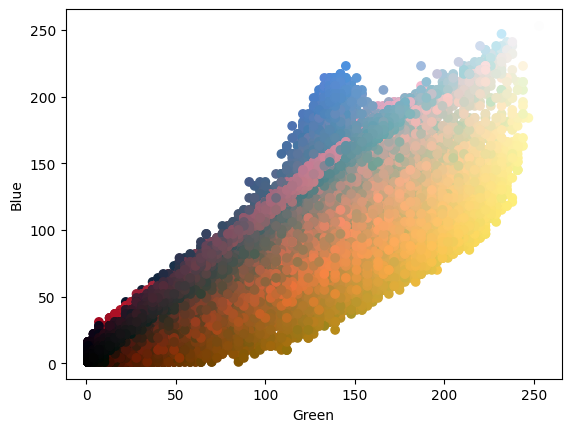

In [ ]:
plt.xlabel("Green")
plt.ylabel("Blue")
plt.scatter(center_df3["G3 center"], center_df3["B3 center"], c=center_df3["colour"])

# Eggblue

In [ ]:
n = len(center_df4)
lst_color = []
for i in range(0,n):
    color_name = webcolors.rgb_to_hex((center_df4['R4 center'][i].astype(int),center_df4['G4 center'][i].astype(int),center_df4['B4 center'][i].astype(int)))
    lst_color.append(color_name)
center_df4['colour'] = lst_color

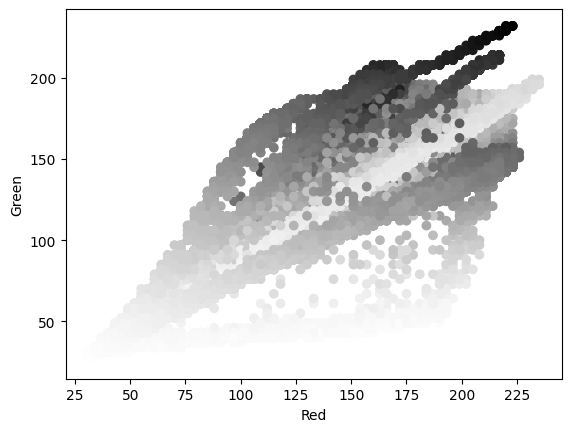

In [ ]:
plt.xlabel("Red")
plt.ylabel("Green")
plt.scatter(center_df4["R4 center"], center_df4["G4 center"], c=center_df4["B4 center"], cmap='Greys')

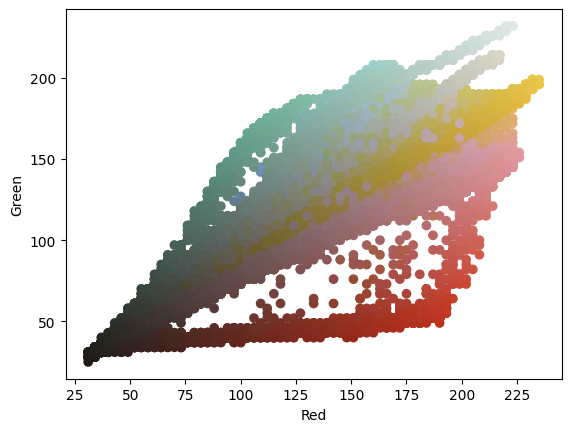

In [ ]:
plt.xlabel("Red")
plt.ylabel("Green")
plt.scatter(center_df4["R4 center"], center_df4["G4 center"], c=center_df4["colour"])

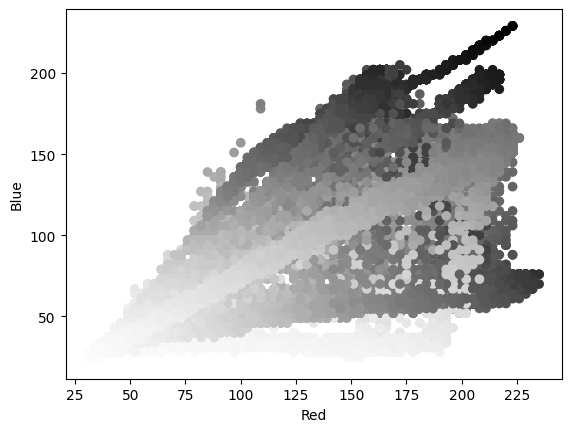

In [ ]:
plt.xlabel("Red")
plt.ylabel("Blue")
plt.scatter(center_df4["R4 center"], center_df4["B4 center"], c=center_df4["G4 center"], cmap='Greys')

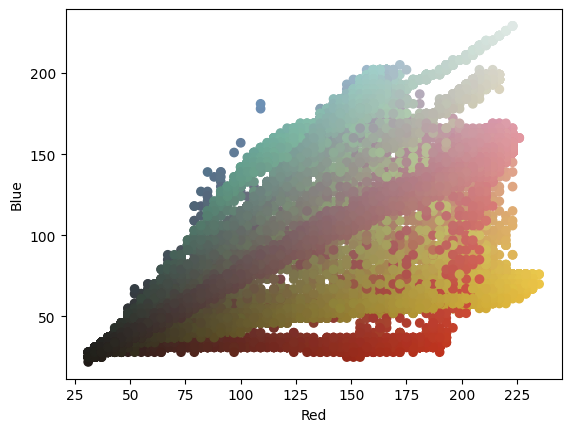

In [ ]:
plt.xlabel("Red")
plt.ylabel("Blue")
plt.scatter(center_df4["R4 center"], center_df4["B4 center"], c=center_df4["colour"])

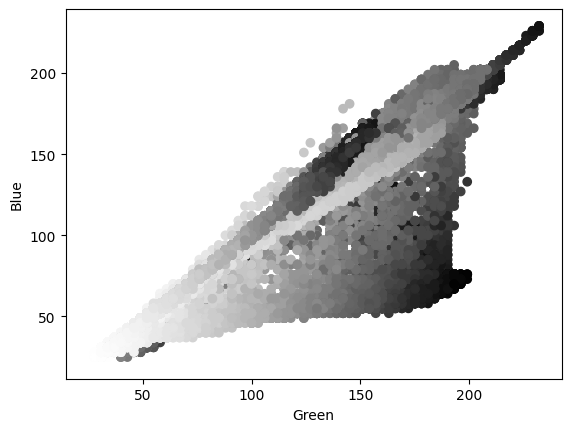

In [ ]:
plt.xlabel("Green")
plt.ylabel("Blue")
plt.scatter(center_df4["G4 center"], center_df4["B4 center"], c=center_df4["R4 center"], cmap='Greys')

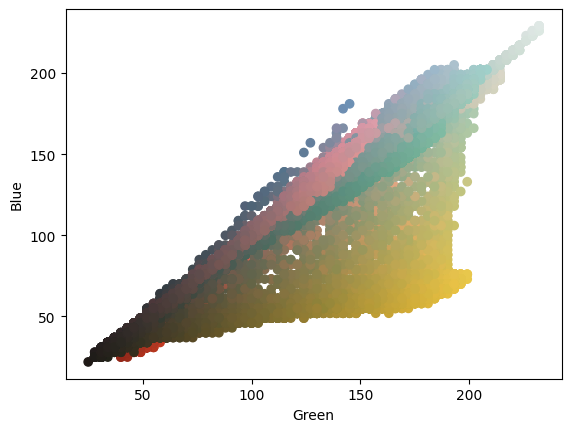

In [ ]:
plt.xlabel("Green")
plt.ylabel("Blue")
plt.scatter(center_df4["G4 center"], center_df4["B4 center"], c=center_df4["colour"])

#Segmentation - ROI

# Background - Orange

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import KMeans
import urllib.parse
import cv2
from matplotlib.colors import hsv_to_rgb

In [ ]:
import numpy as np
import urllib
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import random
import cv2
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import colors
from matplotlib.colors import hsv_to_rgb
import pandas as pd
import seaborn as sns

In [ ]:
def find_color_range(image):
    # Convert the image to the HSV color space
    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

    # Calculate the minimum and maximum values for each channel (H, S, V)
    h_min, s_min, v_min = np.min(hsv_image, axis=(0, 1))
    h_max, s_max, v_max = np.max(hsv_image, axis=(0, 1))

    return (h_min, s_min, v_min), (h_max, s_max, v_max)

In [ ]:
def convert_to_numerical_tuple(tup):
    numerical_tuple = tuple(float(item) for item in tup)
    return numerical_tuple

In [ ]:
import urllib.parse

In [ ]:
req = urllib.request.urlopen(image_links[0])
arr = np.asarray(bytearray(req.read()), dtype=np.uint8)
img = cv2.imdecode(arr, -1) # 'Load it as it is'
# Convert image to matrix
image_matrix = np.array(img)
# Display the shape of the matrix
print(image_matrix.shape)

(960, 960, 4)


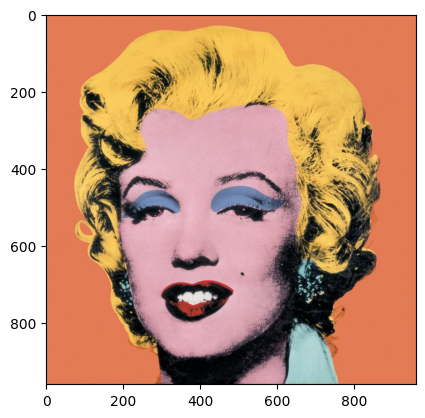

In [ ]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

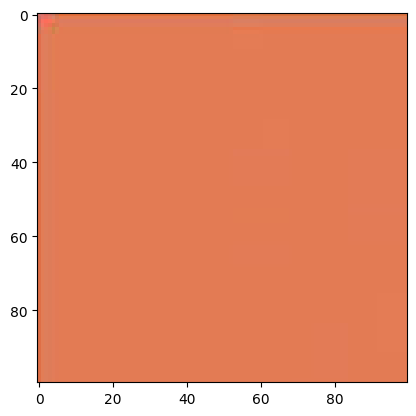

In [ ]:
# Define the coordinates of the region of interest (ROI)
x1, y1 = 0, 0  # Top-left corner
x2, y2 = 100, 100  # Bottom-right corner
# Crop the image
cropped_image = img[y1:y2, x1:x2]
plt.imshow(cropped_image)
plt.show()

In [ ]:
# Load the image
image = cropped_image

# Find the color range in the image
color_range_min, color_range_max = find_color_range(image)

# Print the minimum and maximum values for each channel
h_min, s_min, v_min = color_range_min
h_max, s_max, v_max = color_range_max
print(f"Color Range (Min): H={h_min}, S={s_min}, V={v_min}")
print(f"Color Range (Max): H={h_max}, S={s_max}, V={v_max}")

Color Range (Min): H=2, S=119, V=196
Color Range (Max): H=14, S=194, V=253


In [ ]:
#convert imgage to hsv type
hsv_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

In [ ]:
color_range_min = convert_to_numerical_tuple(color_range_min)
color_range_max = convert_to_numerical_tuple(color_range_max)

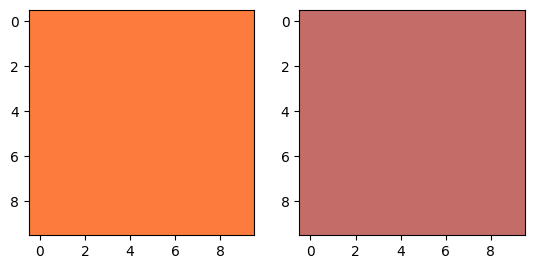

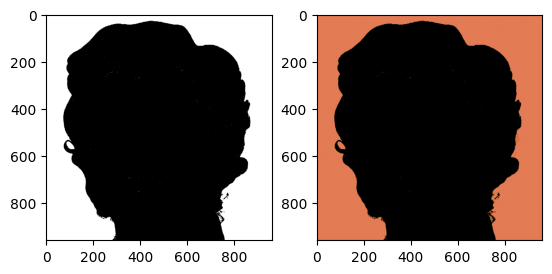

In [ ]:
#define range for background orange
light_orange = color_range_min
dark_orange = color_range_max
lo_square = np.full((10, 10, 3), light_orange, dtype=np.uint8) / 255.0
do_square = np.full((10, 10, 3), dark_orange, dtype=np.uint8) / 255.0
plt.subplot(1, 2, 1)
plt.imshow(hsv_to_rgb(do_square))
plt.subplot(1, 2, 2)
plt.imshow(hsv_to_rgb(lo_square))
plt.show()

#get selected region
mask = cv2.inRange(hsv_img, color_range_min, color_range_max)
background = cv2.bitwise_and(img, img, mask=mask)
plt.subplot(1, 2, 1)
plt.imshow(mask, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(background)
plt.show()

# Background - Red

In [ ]:
req = urllib.request.urlopen(image_links[1])
arr = np.asarray(bytearray(req.read()), dtype=np.uint8)
img = cv2.imdecode(arr, -1) # 'Load it as it is'

In [ ]:
# Define the coordinates of the region of interest (ROI)
x1, x2 = 0, 20
y1, y2 = 0, 900

x3, x4 = 920, 940
y3, y4 = 0, 900

# Crop the image
cropped_image = img[y1:y2, x1:x2]
cropped_image2 = img[y3:y4, x3:x4]

im_h = cv2.hconcat([cropped_image, cropped_image2])

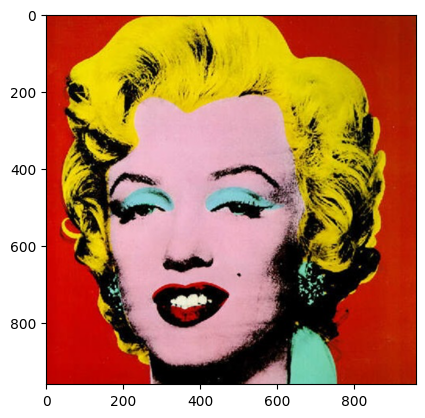

In [ ]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

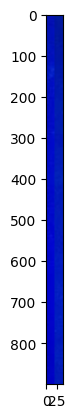

In [ ]:
plt.imshow(im_h)
plt.show()
#cropped_image

In [ ]:
# Load the image
image = im_h
# Find the color range in the image
color_range_min, color_range_max = find_color_range(image)

# Print the minimum and maximum values for each channel
h_min, s_min, v_min = color_range_min
h_max, s_max, v_max = color_range_max
print(f"Color Range (Min): H={h_min}, S={s_min}, V={v_min}")
print(f"Color Range (Max): H={h_max}, S={s_max}, V={v_max}")


Color Range (Min): H=114, S=239, V=151
Color Range (Max): H=120, S=255, V=216


In [ ]:
# Find the color range in the image
color_range_min, color_range_max = find_color_range(image)
color_range_min = convert_to_numerical_tuple(color_range_min)
color_range_max = convert_to_numerical_tuple(color_range_max)

In [ ]:
#convert imgage to hsv type
hsv_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

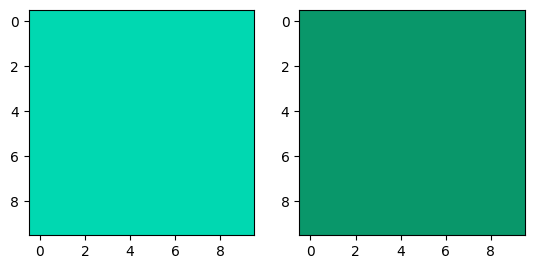

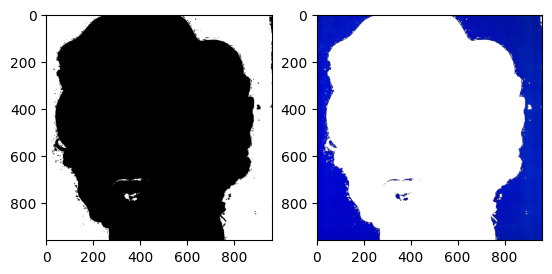

In [ ]:
#define range for background orange
light_orange = color_range_min
dark_orange = color_range_max
lo_square = np.full((10, 10, 3), light_orange, dtype=np.uint8) / 255.0
do_square = np.full((10, 10, 3), dark_orange, dtype=np.uint8) / 255.0
plt.subplot(1, 2, 1)
plt.imshow(hsv_to_rgb(do_square))
plt.subplot(1, 2, 2)
plt.imshow(hsv_to_rgb(lo_square))
plt.show()

#get selected region
mask = cv2.inRange(hsv_img, color_range_min, color_range_max)
background = cv2.bitwise_and(img, img, mask=mask)
plt.subplot(1, 2, 1)
plt.imshow(mask, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(background)
plt.show()

# Background - Turq

In [ ]:
req = urllib.request.urlopen(image_links[2])
arr = np.asarray(bytearray(req.read()), dtype=np.uint8)
img = cv2.imdecode(arr, -1) # 'Load it as it is'

In [ ]:
# Define the coordinates of the region of interest (ROI)
x1, x2 = 0, 20
y1, y2 = 0, 900

x3, x4 = 920, 940
y3, y4 = 0, 900

# Crop the image
cropped_image = img[y1:y2, x1:x2]
cropped_image2 = img[y3:y4, x3:x4]

im_h = cv2.hconcat([cropped_image, cropped_image2])

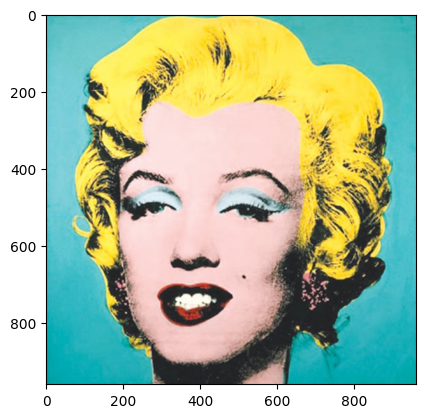

In [ ]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

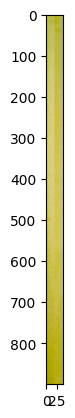

In [ ]:
plt.imshow(im_h)
plt.show()
#cropped_image

In [ ]:
# Load the image
image = im_h
# Find the color range in the image
color_range_min, color_range_max = find_color_range(image)

# Print the minimum and maximum values for each channel
h_min, s_min, v_min = color_range_min
h_max, s_max, v_max = color_range_max
print(f"Color Range (Min): H={h_min}, S={s_min}, V={v_min}")
print(f"Color Range (Max): H={h_max}, S={s_max}, V={v_max}")

Color Range (Min): H=25, S=100, V=158
Color Range (Max): H=32, S=255, V=224


In [ ]:
# Find the color range in the image
color_range_min, color_range_max = find_color_range(image)
color_range_min = convert_to_numerical_tuple(color_range_min)
color_range_max = convert_to_numerical_tuple(color_range_max)

In [ ]:
#convert imgage to hsv type
hsv_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

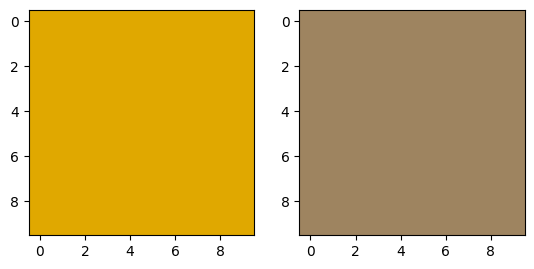

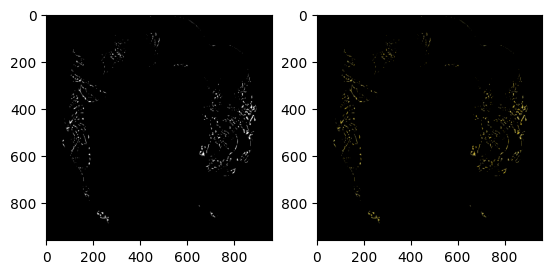

In [ ]:
#define range for background orange
light_orange = color_range_min
dark_orange = color_range_max
lo_square = np.full((10, 10, 3), light_orange, dtype=np.uint8) / 255.0
do_square = np.full((10, 10, 3), dark_orange, dtype=np.uint8) / 255.0
plt.subplot(1, 2, 1)
plt.imshow(hsv_to_rgb(do_square))
plt.subplot(1, 2, 2)
plt.imshow(hsv_to_rgb(lo_square))
plt.show()

#get selected region
mask = cv2.inRange(hsv_img, color_range_min, color_range_max)
background = cv2.bitwise_and(img, img, mask=mask)
plt.subplot(1, 2, 1)
plt.imshow(mask, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(background)
plt.show()

# Background - Blue

In [ ]:
req = urllib.request.urlopen(image_links[3])
arr = np.asarray(bytearray(req.read()), dtype=np.uint8)
img = cv2.imdecode(arr, -1) # 'Load it as it is'

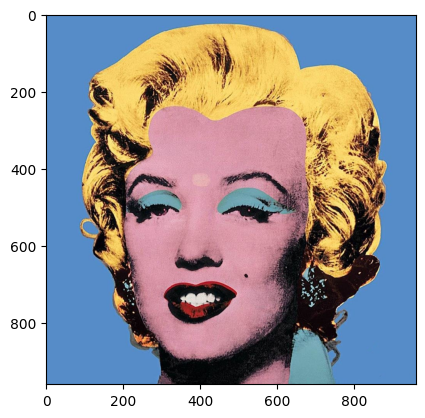

In [ ]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

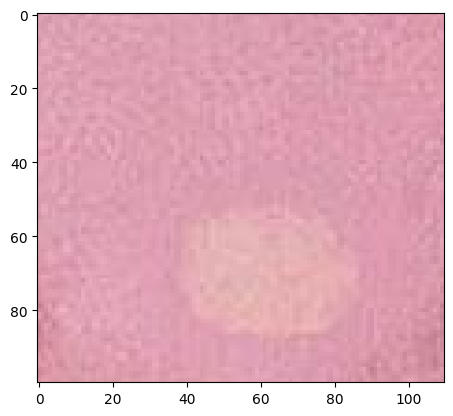

In [ ]:
# Define the coordinates of the region of interest (ROI)
x1, x2 = 340, 450
y1, y2 = 360,  460

# Crop the image
cropped_image = img[y1:y2, x1:x2]
#cropped_image2 = img[y3:y4, x3:x4]


#im_h = cv2.hconcat([cropped_image, cropped_image2])
plt.imshow(cropped_image)
plt.show()


In [ ]:
# Load the image
image = cropped_image2
# Find the color range in the image
color_range_min, color_range_max = find_color_range(image)

# Print the minimum and maximum values for each channel
h_min, s_min, v_min = color_range_min
h_max, s_max, v_max = color_range_max
print(f"Color Range (Min): H={h_min}, S={s_min}, V={v_min}")
print(f"Color Range (Max): H={h_max}, S={s_max}, V={v_max}")

Color Range (Min): H=26, S=136, V=171
Color Range (Max): H=31, S=255, V=214


In [ ]:
# Find the color range in the image
color_range_min, color_range_max = find_color_range(image)
color_range_min = convert_to_numerical_tuple(color_range_min)
color_range_max = convert_to_numerical_tuple(color_range_max)

In [ ]:
#convert imgage to hsv type
hsv_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

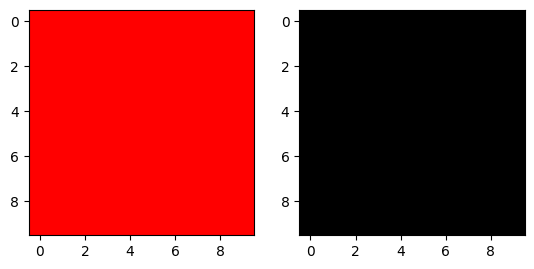

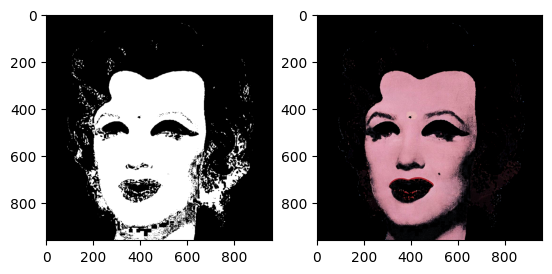

In [ ]:
#define range for background orange
light_orange = (110, 40, 0)
dark_orange = (255, 255, 255)
lo_square = np.full((10, 10, 3), light_orange, dtype=np.uint8) / 255.0
do_square = np.full((10, 10, 3), dark_orange, dtype=np.uint8) / 255.0
plt.subplot(1, 2, 1)
plt.imshow(hsv_to_rgb(do_square))
plt.subplot(1, 2, 2)
plt.imshow(hsv_to_rgb(lo_square))
plt.show()

#get selected region
mask = cv2.inRange(hsv_img, light_orange, dark_orange)
background = cv2.bitwise_and(img, img, mask=mask)
plt.subplot(1, 2, 1)
plt.imshow(mask, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(background)
plt.show()

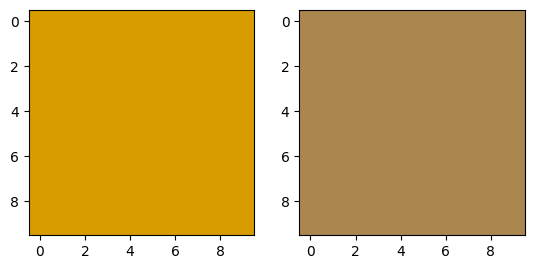

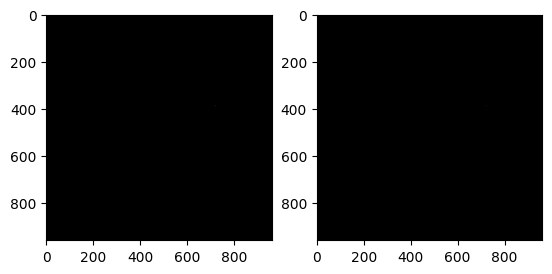

In [ ]:
#define range for background orange
light_orange = color_range_min
dark_orange = color_range_max
lo_square = np.full((10, 10, 3), light_orange, dtype=np.uint8) / 255.0
do_square = np.full((10, 10, 3), dark_orange, dtype=np.uint8) / 255.0
plt.subplot(1, 2, 1)
plt.imshow(hsv_to_rgb(do_square))
plt.subplot(1, 2, 2)
plt.imshow(hsv_to_rgb(lo_square))
plt.show()

#get selected region
mask = cv2.inRange(hsv_img, color_range_min, color_range_max)
background = cv2.bitwise_and(img, img, mask=mask)
plt.subplot(1, 2, 1)
plt.imshow(mask, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(background)
plt.show()

# Background EggBlue

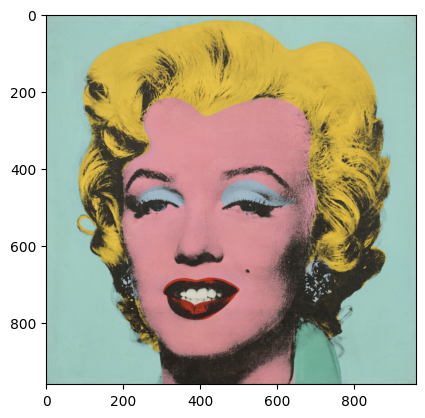

In [ ]:
req = urllib.request.urlopen(image_links[4])
arr = np.asarray(bytearray(req.read()), dtype=np.uint8)
img = cv2.imdecode(arr, -1) # 'Load it as it is'
# Convert image to matrix
image_matrix = np.array(img)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

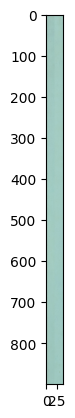

In [ ]:
# Define the coordinates of the region of interest (ROI)
x1, x2 = 0, 20
y1, y2 = 0, 900

x3, x4 = 920, 940
y3, y4 = 0, 900

# Crop the image
cropped_image = img[y1:y2, x1:x2]
cropped_image2 = img[y3:y4, x3:x4]

im_h = cv2.hconcat([cropped_image, cropped_image2])
plt.imshow(im_h)
plt.show()
#cropped_image

In [ ]:
# Load the image
image = im_h
# Find the color range in the image
color_range_min, color_range_max = find_color_range(image)

# Print the minimum and maximum values for each channel
h_min, s_min, v_min = color_range_min
h_max, s_max, v_max = color_range_max
print(f"Color Range (Min): H={h_min}, S={s_min}, V={v_min}")
print(f"Color Range (Max): H={h_max}, S={s_max}, V={v_max}")

Color Range (Min): H=0, S=0, V=171
Color Range (Max): H=88, S=60, V=255


In [ ]:
# Find the color range in the image
color_range_min, color_range_max = find_color_range(image)
color_range_min = convert_to_numerical_tuple(color_range_min)
color_range_max = convert_to_numerical_tuple(color_range_max)
#convert imgage to hsv type
hsv_img = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

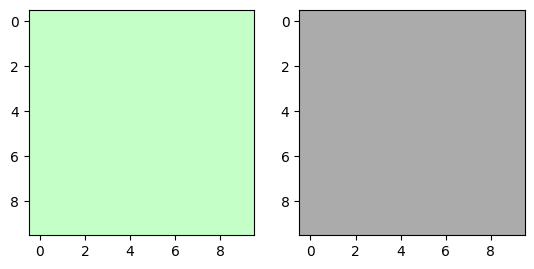

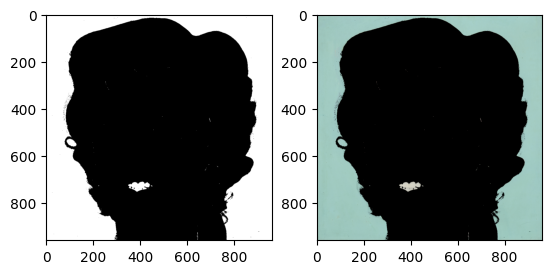

In [ ]:
#define range for background orange
light_orange = color_range_min
dark_orange = color_range_max
lo_square = np.full((10, 10, 3), light_orange, dtype=np.uint8) / 255.0
do_square = np.full((10, 10, 3), dark_orange, dtype=np.uint8) / 255.0
plt.subplot(1, 2, 1)
plt.imshow(hsv_to_rgb(do_square))
plt.subplot(1, 2, 2)
plt.imshow(hsv_to_rgb(lo_square))
plt.show()

#get selected region
mask = cv2.inRange(hsv_img, color_range_min, color_range_max)
background = cv2.bitwise_and(img, img, mask=mask)
plt.subplot(1, 2, 1)
plt.imshow(mask, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(background)
plt.show()